In [1]:
import pandas as pd
import psycopg2 as pg2
from psycopg2 import Error
from tqdm import tqdm
import networkx as nx
from matplotlib import pyplot as plt

In [11]:
# plt 한글설정
from matplotlib import font_manager, rc
font_name = font_manager.FontProperties(fname="/home/consulting/Jupyter/smnoh/font/NanumGothic.ttf").get_name()
rc('font', family=font_name)

In [84]:
# connect PostgreSQL
def query_agens(query):
    import psycopg2 as pg2
    from psycopg2 import Error
    from datetime import datetime
    
    start_tm = datetime.now()
    conn = pg2.connect(database="kg_news",user="consulting", host="192.168.0.68", port="15432")
    cur = conn.cursor()

    path_query = "set graph_path = realestate_news_v3;"
    cur.execute(path_query)
    cur.execute(query)
    result = cur.fetchall()
    
    cur.close()
    conn.close()
    
    end_tm = datetime.now()
    print('START: ', str(start_tm))
    print('END: ', str(end_tm))
    print('ELAP: ', str(end_tm - start_tm))
    
    return result

In [85]:
query = """match (s:noun)-[p:predicate]->(o:noun) return s.word, p.verb, o.word"""
result = query_agens(query)
data = pd.DataFrame(result, columns=['subject', 'predicate', 'object'])
#data = data.loc[:50, :]
data

# depth2 쿼리
# query = """
#     match (n1:noun)-[r1:predicate]->(n2:noun)
#     where n1.word='정부'
#     with n2.word as keyword
#     match (m1:noun)-[r2:predicate]->(m2:noun)-[r3:predicate]->(m3:noun)
#     where m1.word in keyword
#     return m1.word, r2.verb, m2.word, r3.verb, m3.word
# """

# # depth1 쿼리 where 
# query = """
#     match (n1:noun)-[r1:predicate]->(n2:noun)-[r2:predicate]->(n3:noun)
#     where n1.word='정부'
#     with n3.word as keyword
#     match (x:noun)-[r3:predicate]->(o:noun)
#     where x.word in keyword
#     return x.word, r3.verb, o.word
# """

rs = query_agens(query)

START:  2020-12-31 10:59:10.770901
END:  2020-12-31 10:59:10.789024
ELAP:  0:00:00.018123
START:  2020-12-31 10:59:10.791327
END:  2020-12-31 10:59:10.808107
ELAP:  0:00:00.016780


In [88]:
# 방향성 없는 graph 생성
G = nx.Graph()

# n1, n2 고유값 node 생성
node = list(data['subject'].append(data['object']))
node = list(set(node)) # 중복제거
G.add_nodes_from(node)

for i in data.index:
    G.add_edges_from([(data.subject[i], data.object[i], {'verb':data.predicate[i]})])
nx.info(G)

'Name: \nType: Graph\nNumber of nodes: 920\nNumber of edges: 886\nAverage degree:   1.9261'

In [15]:
df = pd.DataFrame(rs)
print(df.shape)
df

(1260, 5)


,0,1,2,3,4
0,임대주택 공급,필요하다,시장,안정되다,913대책 이후
1,임대주택 공급,필요하다,시장,유지되다,기존
2,임대주택 공급,필요하다,시장,꼬이다,규제
3,임대주택 공급,필요하다,시장,불안하다,상승세
4,임대주택 공급,필요하다,시장,증가하다,계약갱신
...,...,...,...,...,...
1255,공공임대,발표하다,대책,없다,현재
1256,공공임대,발표하다,대책,완화하다,전세시장 불안정
1257,공공임대,발표하다,대책,충돌하지 않다,기존 정책
1258,공공임대,발표하다,대책,내다,속도


In [16]:
# depth 1단계
if len(df.columns)==3:
    graph_df = df.copy()
    graph_df.drop_duplicates(subset=[0,1,2], keep='last', inplace=True)
    graph_df.columns=['n1','r1','n2']
    
# depth 2단계까지 했을때
elif len(df.columns)==5:
    tmp_df= df[[0,1,2]]
    tmp_df.drop_duplicates(subset=[0,1,2], keep='last', inplace=True)

    tmp_df_2 = df[[2,3,4]]
    tmp_df_2.drop_duplicates(subset=[2,3,4], keep='last', inplace=True)
    tmp_df_2.columns=[0,1,2]

    graph_df = tmp_df.append(tmp_df_2)
    graph_df.columns=['n1','r1','n2']

<ipython-input-16-1e9a6e16aaa3>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_df.drop_duplicates(subset=[0,1,2], keep='last', inplace=True)
<ipython-input-16-1e9a6e16aaa3>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_df_2.drop_duplicates(subset=[2,3,4], keep='last', inplace=True)


In [93]:
graph_df = graph_df.drop_duplicates()
graph_df

,n1,r1,n2
7,임대주택 공급,필요하다,시장
11,전세대책,포함하다,임대주택공급
21,임대주택공급,좋은대책이다,전세시장
555,임대차법,겪다,전세난
583,임대차법,벌어지다,전세난
...,...,...,...
850,전셋값,오르다,1~2억
851,전셋값,급등하다,모든 지역
852,전셋값,불안하다,내년 이후
853,전셋값,지속하다,상승세


In [18]:
# 너무 많아서 조금 짤랐음
graph_df = graph_df[:120]

In [94]:
# graph 생성
G = nx.Graph()

# n1, n2 고유값 node 생성
node = list(graph_df['n1'].append(graph_df['n2']))
node = list(set(node)) # 중복제거
for i in node:
    G.add_node(i)
    
for i in range(len(graph_df)):
    G.add_edges_from([(graph_df.n1.iloc[i],graph_df.n2.iloc[i],{'verb':graph_df.r1.iloc[i]})])

In [95]:
nx.info(G)

'Name: \nType: Graph\nNumber of nodes: 83\nNumber of edges: 93\nAverage degree:   2.2410'

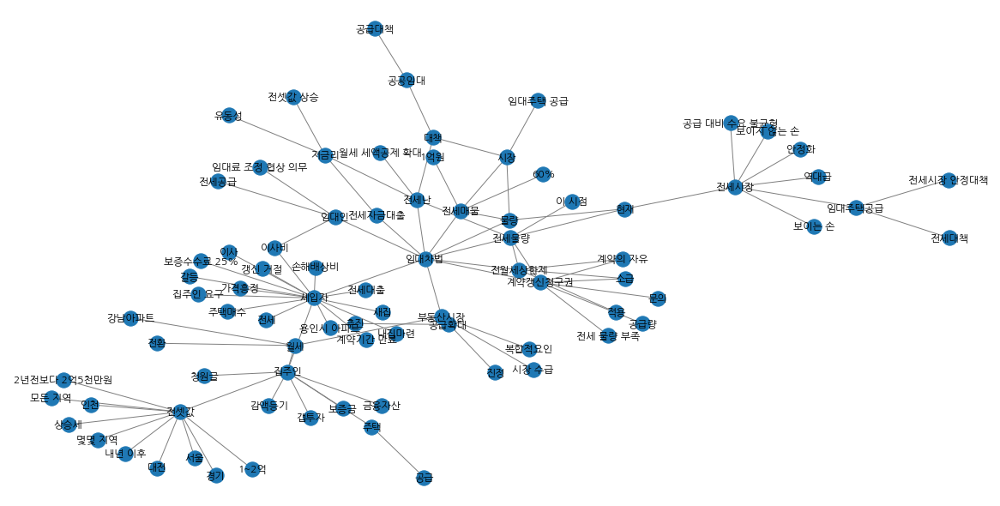

In [64]:
# graph 시각화
plt.figure(figsize=(16, 8))
pos=nx.kamada_kawai_layout(G) # layout 종류 바꾸면 그림이 달라짐 'kamada_kawai_layout' 아니면 'spring_layout'
nx.draw(G,pos, with_labels = True, font_weigth = "bold", font_family=font_name, edge_color='gray')

plt.show()

In [89]:
from networkx.algorithms.community.centrality import girvan_newman
import itertools

comp = girvan_newman(G) # girvan_newman object 생성
comp_list = list(comp) # list로 담기
comp_list

[({'대출자', '원금의5%이상'},
  {'20~30년 후', '균등 지분', '분양자', '지분', '최소 20%'},
  {'서울 전세', '서울거주', '젋은층'},
  {'만전', '주거복지'},
  {'0.23%',
   '1.28%',
   '100조원',
   '101조6,828억원',
   '10가구 중 6가구',
   '1999년',
   '1~2억',
   '1년',
   '1만2000명',
   '1억원',
   '2.24%',
   '2.32%',
   '20.40%',
   '2010년',
   '2011년',
   '2012년',
   '2013년',
   '2015년',
   '2015년 9·2 대책',
   '2개',
   '2년전보다 2억5천만원',
   '2억',
   '3+3 개정안',
   '3.30%',
   '3개월',
   '3기 신도시',
   '3달',
   '3억',
   '3억 중반',
   '3억원',
   '4년',
   '4억 이상',
   '5년',
   '5억 이하 주택',
   '5억 이하 주택구입',
   '5억원',
   '6.71%',
   '60%',
   '617대책',
   '64주',
   '70주',
   '750만원 한도',
   '7월 31일',
   '7월 말',
   '913대책',
   '913대책 이후',
   '가격',
   '가격흥정',
   '가계부채',
   '가속도',
   '가을이사철',
   '갈등',
   '감액등기',
   '강남구',
   '강남아파트',
   '갭투자',
   '갱신 거절',
   '거래',
   '거래량',
   '격차',
   '결과',
   '경기',
   '경기도',
   '경제상황전반',
   '계약',
   '계약갱신',
   '계약갱신청구권',
   '계약기간 만료',
   '계약기간 연장',
   '계약의 자유',
   '계절적요인',
   '고비용 주거 구조',
   '공공임대주택 공급',
   '공급',
   '공급 대비

In [83]:
comp_list = sorted(comp_list, key=len, reverse=True)
for i in comp_list:
    print(len(i))

83
82
81
80
79
78
77
76
75
74
73
72
71
70
69
68
67
66
65
64
63
62
61
60
59
58
57
56
55
54
53
52
51
50
49
48
47
46
45
44
43
42
41
40
39
38
37
36
35
34
33
32
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5
4
3


**조선임님, 최소 군집의 갯수가 3이 아닐수 있어요... 최소 군집수랑 최대 군집수 확인해서 아래코드 확인 부탁드립니다**

In [40]:
comp_list_len = len(comp_list)
min_group_cnt = len(comp_list[0]) 
max_group_cnt = len(comp_list[comp_list_len-1])
print('최소 군집수:',min_group_cnt)
print('최대 군집수:',max_group_cnt)

최소 군집수: 3
최대 군집수: 83


In [41]:
# 가장 큰 단위 군집이 만들어지기 까지 마지막 k개 군집에서 최소 군집 수 갯수까지 확인 가능
k = 10
community_list = []

for i in range(comp_list_len):
    if len(comp_list[i])<=k:
        tmp_list = []
        for j in range(len(comp_list[i])):
            tmp_list.append(list(comp_list[i][j]))
        community_list.append(tmp_list)

In [50]:
for i in community_list:
    print(i)

[['물량', '1억원', '대책', '저금리', '유동성', '60%', '보이는 손', '현재', '전세시장', '전세시장 안정대책', '계약의 자유', '역대급', '공급대책', '계약갱신청구권', '월세 세액공제 확대', '공공임대', '안정화', '전세물량', '임대주택 공급', '시장', '이 시점', '전세공급', '임대인', '전세매물', '보이지 않는 손', '임대주택공급', '전셋값 상승', '문의', '전세난', '소급', '임대료 조정 협상 의무', '적용', '이사비', '공급 대비 수요 불균형', '임대차법', '전세자금대출', '전세대책', '전월세상한제', '공급량', '전세 물량 부족'], ['내년 이후', '청원글', '서울', '주택매수', '대전', '내집마련', '전세대출', '모든 지역', '시장 수급', '가격흥정', '감액등기', '용인시 아파트', '1~2억', '집주인', '갭투자', '갱신 거절', '경기', '상승세', '전셋값', '보증수수료 25%', '전환', '공급', '진정', '보증금', '이사', '강남아파트', '세입자', '전세', '복합적요인', '갈등', '금융자산', '2년전보다 2억5천만원', '인천', '부동산시장', '계약기간 만료', '집주인 요구', '월세', '새집', '몇몇 지역', '주택', '손해배상비'], ['추진', '공급확대']]
[['물량', '1억원', '대책', '저금리', '유동성', '60%', '보이는 손', '현재', '전세시장', '전세시장 안정대책', '계약의 자유', '역대급', '공급대책', '계약갱신청구권', '월세 세액공제 확대', '공공임대', '안정화', '전세물량', '임대주택 공급', '시장', '이 시점', '전세공급', '임대인', '전세매물', '보이지 않는 손', '임대주택공급', '전셋값 상승', '문의', '전세난', '소급', '임대료 조정 협상 의무', '적용', '이사비', '공급 대비 수요 불균형', '임대차법', '전세

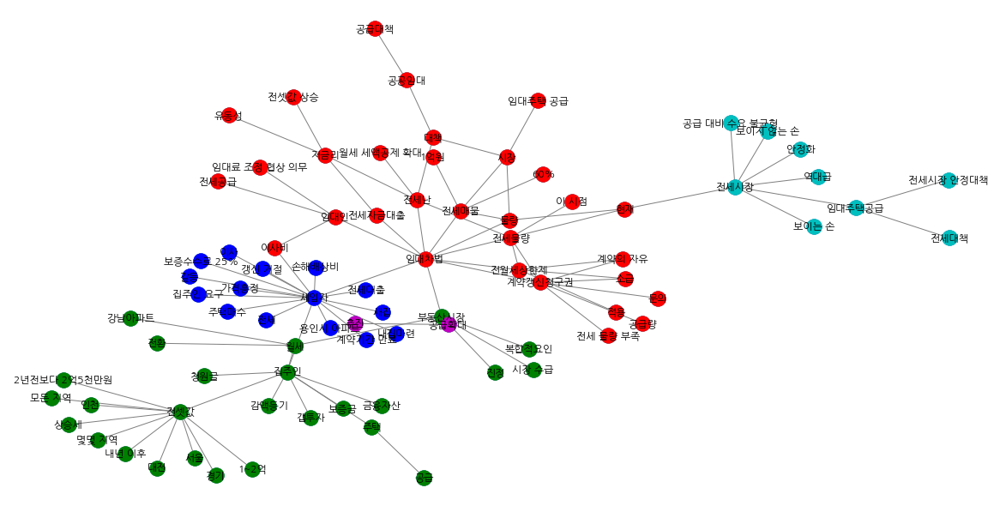

In [53]:
cor_list=['r','g','b','c','m','y','orange','purple','gray','saddlebrown']

plt.figure(figsize=(16, 8))
# 전체 그래프 그리기
nx.draw(G,pos, with_labels = True, font_weigth = "bold", font_family=font_name, edge_color='gray')

# 그룹이 n개로 나누어지게 node색 지정
n=5
for i in range(n):
    nx.draw_networkx_nodes(G,pos, 
                           nodelist=community_list[n-min_group_cnt][i], 
                           node_color=cor_list[i])    

In [474]:
# edge betweenness centrality가 높은 edge 만 뽑기
def f2(x):
    return x[1]

res = sorted(nx.edge_betweenness_centrality(G).items(), key=f2, reverse=True)
# nx.edge_betweenness_centrality(G)
res

[(('임대차법', '세입자'), 0.3981780781663239),
 (('집주인', '세입자'), 0.32118718777549227),
 (('전셋값', '집주인'), 0.22627093740816928),
 (('전세시장', '현재'), 0.1904202174551866),
 (('전세물량', '현재'), 0.11813106082868059),
 (('물량', '임대차법'), 0.1034381428151631),
 (('임대차법', '전세난'), 0.10094034675286512),
 (('임대차법', '전세물량'), 0.09932412577137821),
 (('임대차법', '부동산시장'), 0.09903026741110786),
 (('물량', '현재'), 0.09168380840434912),
 (('임대차법', '계약갱신청구권'), 0.08507199529826624),
 (('전세매물', '임대차법'), 0.07111372318542464),
 (('임대주택공급', '전세시장'), 0.06876285630326183),
 (('대책', '전세난'), 0.06229797237731414),
 (('월세', '부동산시장'), 0.06024096385542169),
 (('임대차법', '임대인'), 0.05877167205406994),
 (('집주인', '월세'), 0.0531883632089333),
 (('임대차법', '전월세상한제'), 0.051278283867176026),
 (('주택', '집주인'), 0.046429620922715256),
 (('대책', '공공임대'), 0.046429620922715256),
 (('임대차법', '전세자금대출'), 0.04628269174258008),
 (('저금리', '전세난'), 0.04422568322068763),
 (('전세물량', '전세난'), 0.03232441962973846),
 (('세입자', '이사비'), 0.03173670290919777),
 (('시장', '물량'), 0

In [475]:
red_edges = [('임대차법', '세입자'),('집주인', '세입자'),('전셋값','집주인')]

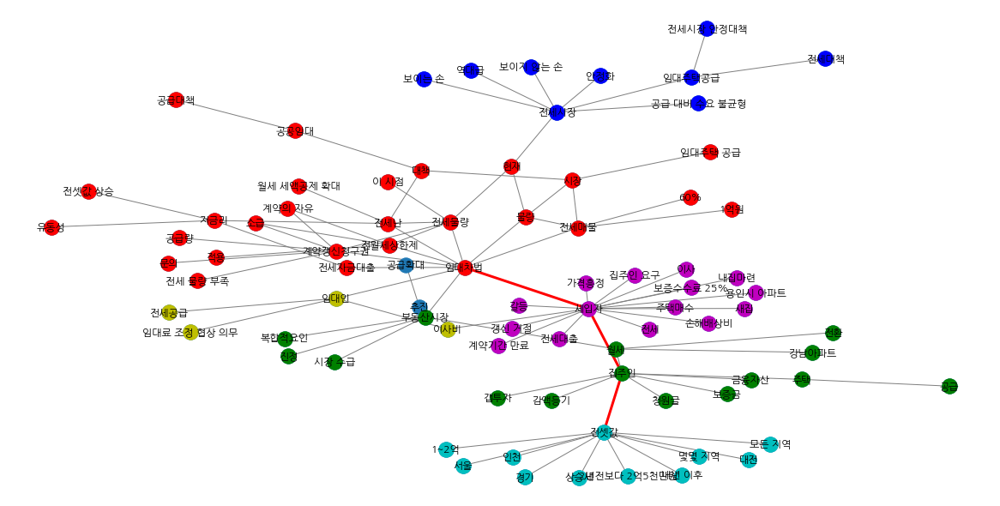

In [486]:
cor_list=['r','g','b','c','m','y','orange','purple','gray']

plt.figure(figsize=(16, 8))
nx.draw(G,pos, with_labels = True, font_weigth = "bold", font_family=font_name, edge_color='gray')

n=6
for i in range(n):
    nx.draw_networkx_nodes(G,pos, nodelist=community_list[n-2][i], node_color=cor_list[i])    
# 주관적으로 선택한 edge만 빨간색으로 표기
nx.draw_networkx_edges(G, pos, edgelist=red_edges, edge_color='r', width=3)